# Results visualization
This notebook is used to visualise the outcome of the optimization for the Zambezi river basin case. In this notebook the best decisions of each case are also saved, for the simulation. Therefore, this file must be run prior to the simulation notebook. 

In [7]:
pip install openpyxl

  Using cached openpyxl-3.1.5-py2.py3-none-any.whl.metadata (2.5 kB)
  Using cached et_xmlfile-2.0.0-py3-none-any.whl.metadata (2.7 kB)
Using cached openpyxl-3.1.5-py2.py3-none-any.whl (250 kB)
Using cached et_xmlfile-2.0.0-py3-none-any.whl (18 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [openpyxl]1/2 [openpyxl]

[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [8]:
import os 
os.getcwd()
import pandas as pd
import matplotlib.pyplot as plt
from pymoo.visualization.pcp import PCP
import seaborn as sns  
from mpl_toolkits.mplot3d import Axes3D
import sys
import numpy as np
import matplotlib.cm as cm
import hiplot as hip

if not os.path.exists("../src"):
    os.chdir("../../src")
else:
    os.chdir('../src')
os.getcwd()

# This was needed since importing hiplot gave an error
#sys.path
#path = r'C:\users\whitl\appdata\local\packages\pythonsoftwarefoundation.python.3.11_qbz5n2kfra8p0\localcache\local-packages\python311\site-packages'
#sys.path.append(path)
#sys.path



'/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/src'

In [9]:
from ema_workbench import (MultiprocessingEvaluator, ema_logging, RealParameter, ScalarOutcome, Constant,
                           Model, HypervolumeMetric, save_results)
from ema_workbench.em_framework.optimization import (GenerationalBorg, epsilon_nondominated, to_problem, ArchiveLogger,
                                                     EpsilonProgress, Hypervolume)

## BASE CASE
The base base has three objectives: hydropower production deficit, irrigation deficit and environmental flow deficit

In [10]:
from model_zambezi_OPT import ModelZambezi

ZambeziProblem = ModelZambezi()

def model_wrapper(**kwargs):
    input = [kwargs['v' + str(i)] for i in range(len(kwargs))]
    # print('len kwargs is', len(kwargs)) = 230
    Hydropower, Environment, Irrigation = tuple(ZambeziProblem.evaluate(np.array(input)))
    return Hydropower, Environment, Irrigation

# specify model
model = Model('zambeziproblem', function=model_wrapper)

# levers
model.levers = [RealParameter('v' + str(i), -1, 1) for i in range(ZambeziProblem.Nvar)]

# specify outcomes
model.outcomes = [ScalarOutcome('Hydropower', ScalarOutcome.MINIMIZE),  # Minimize, because deficits
                  ScalarOutcome('Environment', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation', ScalarOutcome.MINIMIZE)]


In [11]:
runname = "BC_BC_pseudo_200000nfe_5seed"
os.chdir(f'../runs/{runname}')

In [12]:
column_names = ['Hydropower', 'Environment', 'Irrigation']

results_list = []
for i in range(5):
    result = pd.read_csv(f"results_seed{i}.csv") # Create the results list, containing dataframes with the results per seed 
    globals()[f'df_{i}'] = pd.read_csv(f"results_seed{i}.csv", usecols = column_names) # create dataframes per seed with results for analysis
        #archives.items()[nfe] =
        #archives = archives.loc[:, ~archives.columns.str.contains('^Unnamed')]
    results_list.append(result)


In [13]:
#############
# MERGE SEEDS
#############

# Merge the 5 runs of the optimization
problem = to_problem(model, searchover="levers")
epsilons = [0.4, 0.4, 0.4]

merged_results = epsilon_nondominated(results_list, epsilons, problem)

print('merged_results', merged_results, 'saved to: ', os.getcwd())

# Save the results
merged_results_name = 'merged_results.csv'
cwd = os.getcwd()
#merged_results.to_csv(os.path.join(cwd, merged_results_name), index=False)

merged_results           v0        v1        v2        v3        v4        v5        v6  \
0   0.078060 -0.070070 -0.121587 -0.120688  0.714311  0.343456  0.450844   
1   0.284991 -0.080194 -0.029531 -0.050081  0.716560  0.538860  0.440355   
2  -0.381754 -0.151630 -0.942262 -0.087805  0.513258  0.081801  0.447070   
3  -0.395973  0.930877  0.401640 -0.121833  0.551748  0.594019  0.639148   
4  -0.424978  0.969380 -0.643550 -0.117425  0.577221  0.575089  0.511600   
..       ...       ...       ...       ...       ...       ...       ...   
93  0.732997  0.998006  0.999799  0.985574  0.997051  0.975528  0.783568   
94  0.732997  0.998006  0.999818  0.985574  0.997458  0.975528  0.762242   
95  0.635677  0.955620  0.996224  0.993574  0.989080  0.975158  0.914849   
96 -0.872153  0.995948  0.981048  0.014220  0.998355  0.963368  0.904868   
97  0.921269  0.995948  0.993873  0.984166  0.998244  0.726386  0.977594   

          v7        v8        v9  ...      v223      v224      v225     

In [14]:
# Load the merged results
column_names = ['Hydropower', 'Environment', 'Irrigation']
df_bc = pd.read_csv(f"merged_results.csv", usecols = column_names)#, index_col=0) #, usecols = column_names)


In [15]:
df_bc

,Hydropower,Environment,Irrigation
0,11.594989,3.194563e+06,1.198328
1,11.195192,2.977529e+06,1.745484
2,15.203274,1.032662e+06,0.284340
3,13.148074,1.267974e+06,1.528635
4,11.999141,2.473003e+06,1.088327
...,...,...,...
93,12.795735,1.439816e+06,3.949251
94,12.780223,1.494661e+06,3.538539
95,12.398527,1.804893e+06,3.425051
96,15.981639,1.150384e+05,2.262485


### Tradeoffs
Parallel plots

In [16]:
df_bc.min()

Hydropower        11.134352
Environment    21349.770265
Irrigation         0.282814
dtype: float64

In [17]:
print(df_bc.columns)

Index(['Hydropower', 'Environment', 'Irrigation'], dtype='object')


In [18]:
os.getcwd()

'/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/runs/BC_BC_pseudo_200000nfe_5seed'

In [19]:
policies, objectives = df_bc.iloc[:, :], df_bc.iloc[:, :]
objectives.columns = [
    "Hydropower deficit",
    "Environmental flow deficit",
    "Irrigation deficit"
]
objectives.describe()

,Hydropower deficit,Environmental flow deficit,Irrigation deficit
count,98.000000,9.800000e+01,98.000000
mean,14.463381,1.037135e+06,1.652657
std,1.869395,9.776938e+05,0.961859
min,11.134352,2.134977e+04,0.282814
25%,12.796644,1.647478e+05,1.093817
50%,14.481145,7.410802e+05,1.538252
75%,15.964444,1.711150e+06,2.143544
max,18.199028,3.591053e+06,3.994135


In [20]:
def get_min_index(df, column):
    # Find all rows with the minimum value for this column
    min_rows = df[df[column] == df[column].min()]
    # Find the row with lowest value across all columns
    min_index = min_rows.apply(np.min, axis=1).idxmin()
    
    return min_index

index_h = get_min_index(df_bc, 'Hydropower')
index_e = get_min_index(df_bc, 'Environment')
index_i = get_min_index(df_bc, 'Irrigation')

In [21]:
iris_hiplot = hip.Experiment.from_dataframe(df_bc)
iris_hiplot.display()

<IPython.core.display.Javascript object>

/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/runs/BC_BC_pseudo_200000nfe_5seed


<Figure size 3000x1500 with 0 Axes>

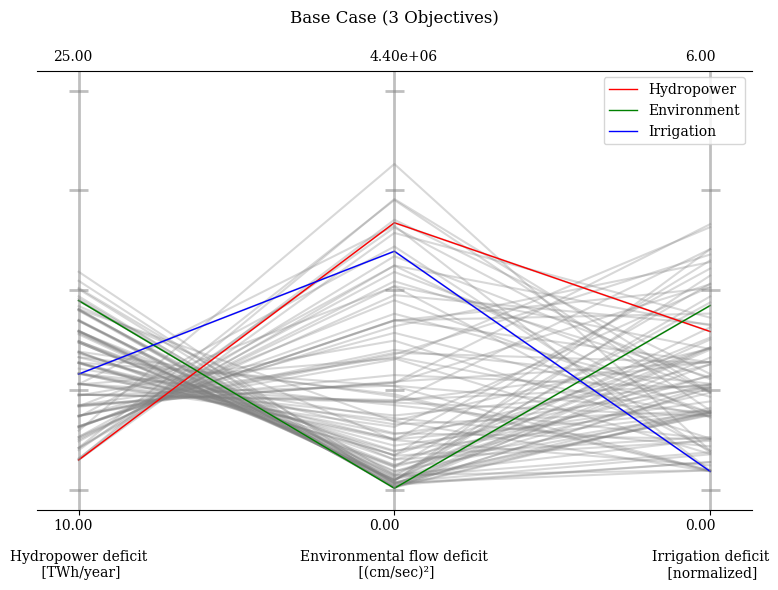

In [22]:
objectives = df_bc.values

fig = plt.figure(figsize=(10, 5), dpi=300)

plot = PCP(legend = (True, {'loc': "upper right"}), labels=["Hydropower deficit\n [TWh/year]", "Environmental flow deficit\n [(cm/sec)\u00B2]", 
                                                            "Irrigation deficit\n [normalized]"], title = ("Base Case (3 Objectives)\n\n"))
plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)
plot.add(objectives[index_h], linewidth=1, color="red", label = 'Hydropower')
plot.add(objectives[index_e], linewidth=1, color="green", label = 'Environment')
plot.add(objectives[index_i], linewidth=1, color="blue", label = 'Irrigation')

print(os.getcwd())
relative_path = '../../plots'
filename = 'bc_tradeoffs.png'
plot.bounds=[[10,0,0],[25,4400000,6]]
plot.show()
plt.tight_layout()

# Save the plot to the specified relative path and filename
plt.savefig(os.path.join(relative_path, filename))

### 3D plot

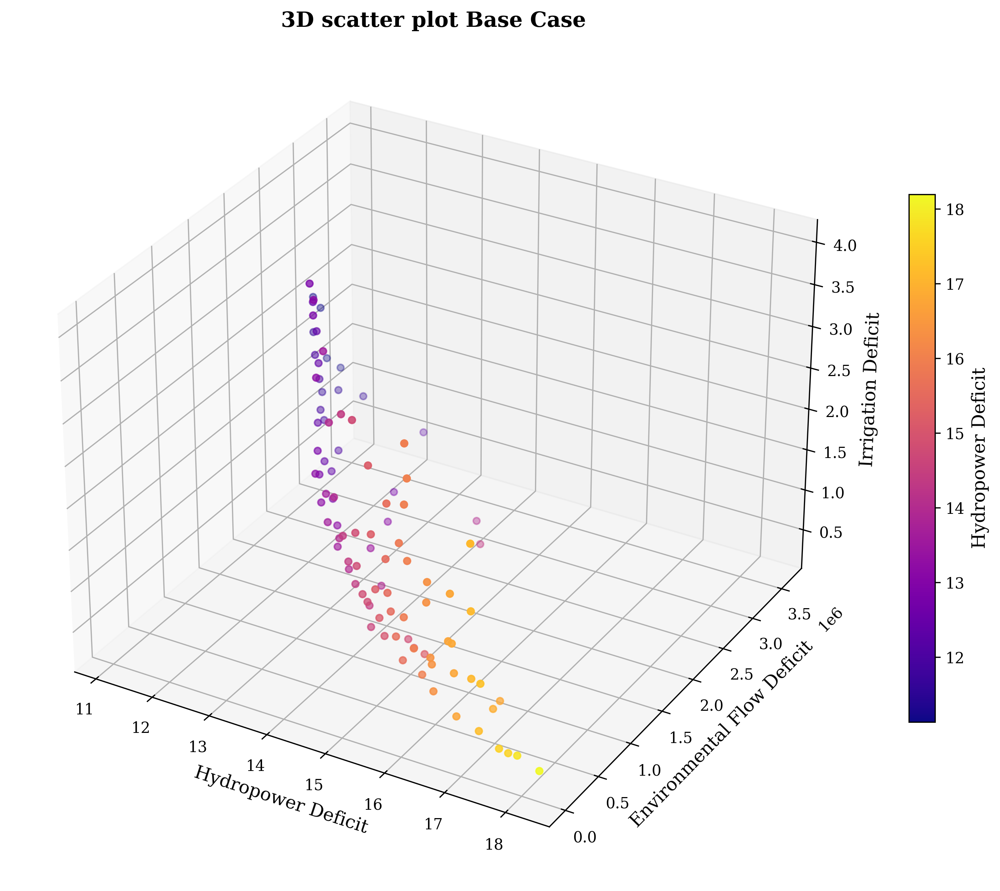

In [23]:
# Create a 3D plot
from mpl_toolkits.mplot3d import Axes3D  

outcomes = df_bc

# Create a 3D plot
fig = plt.figure(figsize=(10, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(outcomes['Hydropower'], outcomes['Environment'], outcomes['Irrigation'], 
                c=outcomes['Hydropower'], cmap='plasma', marker='o')

# Add color bar
cbar = plt.colorbar(sc, ax=ax, shrink=0.5, aspect=20)
cbar.set_label('Hydropower Deficit', fontsize=12)

# Set axis labels
ax.set_xlabel('Hydropower Deficit', fontsize=12)
ax.set_ylabel('Environmental Flow Deficit', fontsize=12)
ax.set_zlabel('Irrigation Deficit', fontsize=12)

# Set title
ax.set_title('3D scatter plot Base Case', fontsize=14, fontweight='bold')

# Add grid for better visualization
ax.grid(True)

# Adjust layout
plt.tight_layout()

# Save the plot to the specified relative path and filename
relative_path = '../plots'
if not os.path.exists(relative_path):
    os.makedirs(relative_path)
filename = 'bc_3D.png'
plt.savefig(os.path.join(relative_path, filename), bbox_inches='tight', dpi=300)

# Show the plot
plt.show()

## Save the best decisions for the simulation

In [24]:
# Create a dataframe without the column names for the simulation
df_v = pd.read_csv("merged_results.csv", usecols=lambda x: x not in column_names )

# Extract the rows of the best solutions
best_hyd_row = df_v.loc[[index_h]]
best_env_row = df_v.loc[[index_e]]
best_irr_row = df_v.loc[[index_i]]

#Save the best decisions for the simulation
out_path = "../../decisions/basecase/"
if not os.path.exists(out_path):
    os.mkdir(out_path)
os.chdir(out_path)
best_hyd_row.to_csv("decisions_best_hydro.txt", index=False, header=None, sep='\n')
best_env_row.to_csv("decisions_best_env.txt", index=False, header=None, sep='\n')
best_irr_row.to_csv("decisions_best_irr.txt", index=False, header=None, sep='\n')

#Save the other decisions for comparison



os.chdir(cwd)

FileNotFoundError: [Errno 2] No such file or directory: '../../decisions/basecase/'

## IRRIGATION CASE, 1 MLN NFEs 
5 runs with 1 mln NFEs per run are combined and analyzed as one run. Computing restraints limited the runs to 1 million nfe's per run

In [25]:
if not os.path.exists("../src"):
    os.chdir("../../src")
else:
    os.chdir('../src')
os.getcwd()

'/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/src'

In [26]:
from model_zambezi_OPT_irr import ModelZambezi

ZambeziProblem = ModelZambezi()

def model_wrapper(**kwargs):
    input = [kwargs['v' + str(i)] for i in range(len(kwargs))]
    Hydropower, Environment, Irrigation, Irrigation2, Irrigation3, Irrigation4, Irrigation5, Irrigation6, Irrigation7, \
        Irrigation8, Irrigation9 = tuple(ZambeziProblem.evaluate(np.array(input)))
    return Hydropower, Environment, Irrigation, Irrigation2, Irrigation3, Irrigation4, Irrigation5, Irrigation6, \
        Irrigation7, Irrigation8, Irrigation9
# specify model
model = Model('zambeziproblem', function=model_wrapper)

# levers
model.levers = [RealParameter('v' + str(i), -1, 1) for i in range(ZambeziProblem.Nvar)]

# specify outcomes
model.outcomes = [ScalarOutcome('Hydropower', ScalarOutcome.MINIMIZE),  # Minimize, because deficits
                  ScalarOutcome('Environment', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation2', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation3', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation4', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation5', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation6', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation7', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation8', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation9', ScalarOutcome.MINIMIZE),
                  ]
#Problem definitionv
problem = to_problem(model, searchover="levers")

In [27]:
nfe = 1000000 #
seeds = 1
nth_list = ['1st','2nd','3rd','4th','5th']
column_names = ['Hydropower', 'Environment', 'Irrigation', 'Irrigation2', 'Irrigation3', 'Irrigation4', 'Irrigation5', 'Irrigation6', \
        'Irrigation7', 'Irrigation8', 'Irrigation9']
run_folder_path = f'../runs' 
results_list = []

for i in nth_list:
    run_label = f"IR_new_pseudo_{i}_mln_{nfe}nfe_{seeds}seed"
    
    result = pd.read_csv(os.path.join(run_folder_path, run_label, f"results_seed0.csv")) # Create the results list, containing dataframes with the results per seed 
    
    results_list.append(result)
    #globals()[f'df_{i}'] = pd.read_csv(f"results_seed{i}.csv", usecols = column_names) # create dataframes per seed with results for analysis
        #archives.items()[nfe] =
        #archives = archives.loc[:, ~archives.columns.str.contains('^Unnamed')]
    #results_list.append(result)

mln_run_file_name = 'IR_new_pseudo_mln_1000000nfe_5seed'

relative_path = os.path.join(run_folder_path, mln_run_file_name)

if not os.path.exists(relative_path):
    os.makedirs(relative_path)
    
os.chdir(relative_path)

In [28]:
os.getcwd()

'/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/runs/IR_new_pseudo_mln_1000000nfe_5seed'

In [29]:
#############
# MERGE SEEDS
#############

# Merge the 5 runs of the optimization
problem = to_problem(model, searchover="levers")
epsilons = [0.68] * len(model.outcomes)
merged_results = epsilon_nondominated(results_list, epsilons, problem)

print('merged_results', merged_results, 'saved to: ', os.getcwd())

# Save the results
merged_results_name = 'merged_results.csv'
cwd = os.getcwd()
merged_results.to_csv(os.path.join(cwd, merged_results_name), index=False)

merged_results            v0        v1        v2        v3        v4        v5        v6  \
0    0.115213  0.220295  0.497559  0.523116  0.358025  0.929841  0.313601   
1    0.950379  0.926748  0.607978  0.952861  0.928582  0.768524  0.478503   
2    0.139251  0.488831  0.564577  0.959710  0.541074  0.943040  0.662081   
3    0.268380  0.704241  0.421735  0.924037  0.483413  0.732939  0.393609   
4    0.962812  0.861783  0.916474  0.396239  0.844483  0.798081  0.641173   
..        ...       ...       ...       ...       ...       ...       ...   
112  0.133790  0.970244  0.397062  0.804298  0.345994  0.811479  0.888169   
113  0.389623  0.304782  0.793780  0.881376  0.833050  0.720523  0.854831   
114  0.389623  0.826321  0.730272  0.912068  0.843549  0.906549  0.854831   
115  0.820707  0.938977  0.312020  0.807714  0.347300  0.954190  0.886791   
116  0.361586  0.124516  0.372914  0.620926  0.308350  0.673564  0.991037   

           v7        v8        v9  ...    Environment  Irrig

In [30]:
# Load the merged results
column_names = ['Hydropower', 'Environment', 'Irrigation', 'Irrigation2', 'Irrigation3', 'Irrigation4', 'Irrigation5', 'Irrigation6', \
        'Irrigation7', 'Irrigation8', 'Irrigation9']
df_irr = pd.read_csv(f"merged_results.csv", usecols = column_names)#, index_col=0) #, usecols = column_names)

In [31]:
df_irr

,Hydropower,Environment,Irrigation,Irrigation2,Irrigation3,Irrigation4,Irrigation5,Irrigation6,Irrigation7,Irrigation8,Irrigation9
0,15.427965,541599.493298,1.656515,0.037407,0.185258,0.331671,0.106593,0.383604,0.133333,0.351712,0.126938
1,19.549680,2126.296700,3.276332,0.765059,0.375426,0.622827,0.025429,0.069249,0.087500,0.562500,0.768342
2,20.255171,244.896953,3.289793,0.142558,0.526053,0.542588,0.086285,0.501907,0.316667,0.579167,0.594567
3,19.967638,754.761891,1.844053,0.320550,0.195846,0.421405,0.037929,0.350990,0.029167,0.241667,0.246501
4,18.177383,42870.423045,3.376453,0.752482,0.222908,0.612595,0.391910,0.506673,0.145833,0.233333,0.510718
...,...,...,...,...,...,...,...,...,...,...,...
112,18.186342,57347.952970,1.797108,0.221486,0.140916,0.265602,0.409994,0.086740,0.016667,0.398462,0.257240
113,16.291177,189953.832232,2.890630,0.219533,0.442800,0.527827,0.413963,0.294528,0.091667,0.308333,0.591980
114,16.071248,187395.225902,3.429874,0.538207,0.421911,0.638090,0.435043,0.255687,0.233333,0.279167,0.628437
115,15.361466,529958.590832,2.293387,0.734591,0.135531,0.320424,0.270845,0.296670,0.133333,0.304167,0.097825


In [32]:
df_irr.min()

Hydropower     10.782189
Environment     0.000000
Irrigation      0.246812
Irrigation2     0.003725
Irrigation3     0.000208
Irrigation4     0.001124
Irrigation5     0.000037
Irrigation6     0.000635
Irrigation7     0.000000
Irrigation8     0.179167
Irrigation9     0.000652
dtype: float64

In [33]:
os.getcwd()

'/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/runs/IR_new_pseudo_mln_1000000nfe_5seed'

### 3d plot

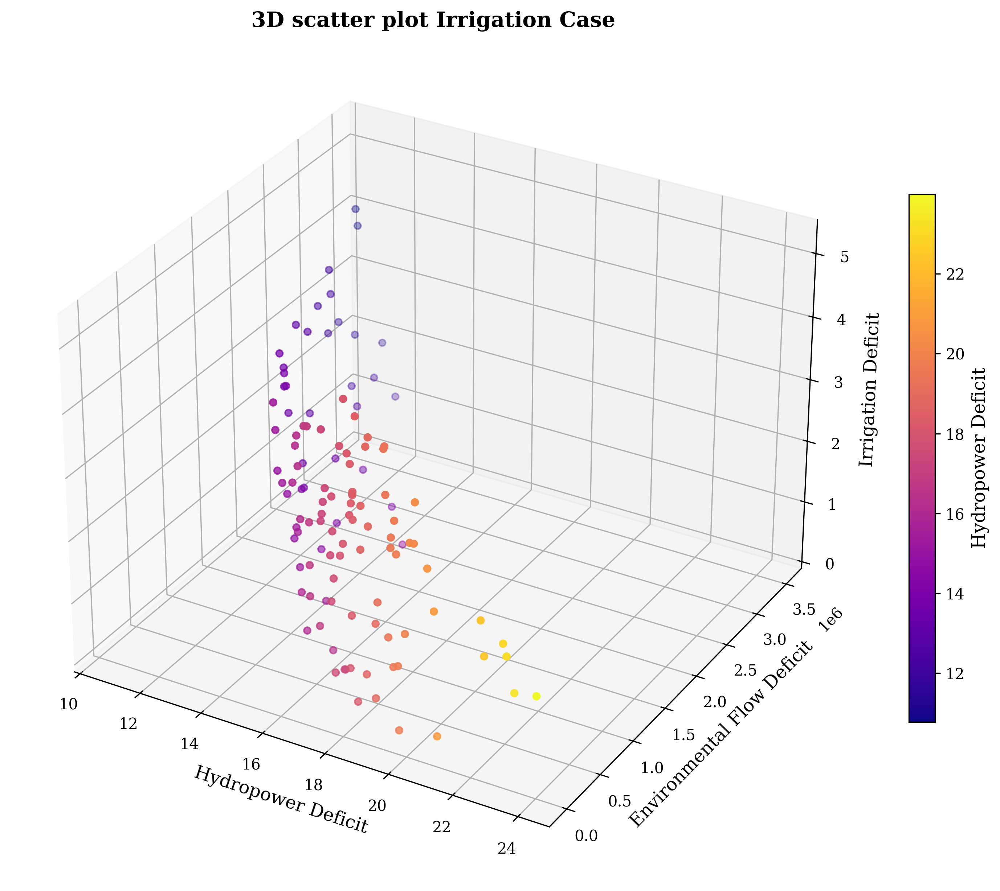

In [34]:
# Create a 3D plot
outcomes = df_irr

fig = plt.figure(figsize=(10, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(outcomes['Hydropower'], outcomes['Environment'], outcomes['Irrigation'], 
                c=outcomes['Hydropower'], cmap='plasma', marker='o')

# Add color bar
cbar = plt.colorbar(sc, ax=ax, shrink=0.5, aspect=20)
cbar.set_label('Hydropower Deficit', fontsize=12)

# Set axis labels
ax.set_xlabel('Hydropower Deficit', fontsize=12)
ax.set_ylabel('Environmental Flow Deficit', fontsize=12)
ax.set_zlabel('Irrigation Deficit', fontsize=12)

# Set title
ax.set_title('3D scatter plot Irrigation Case', fontsize=14, fontweight='bold')

# Add grid for better visualization
ax.grid(True)

# Adjust layout
plt.tight_layout()

# Save the plot to the specified relative path and filename
relative_path = '../../plots'
#if not os.path.exists(relative_path):
#    print('no path')
filename = 'irr_3D.png'
#plt.savefig(os.path.join(relative_path, filename), bbox_inches='tight', dpi=300)

# Show the plot
plt.show()

### Parallel plot

In [35]:
def get_min_index(df, column):
    # Find all rows with the minimum value for this column
    min_rows = df[df[column] == df[column].min()]
    # Find the row with lowest value across all columns
    min_index = min_rows.apply(np.min, axis=1).idxmin()
    
    return min_index

index_h = get_min_index(df_irr, 'Hydropower')
index_e = get_min_index(df_irr, 'Environment')
index_i = get_min_index(df_irr, 'Irrigation')
index_i2 = get_min_index(df_irr, 'Irrigation2')
index_i3 = get_min_index(df_irr, 'Irrigation3')
index_i4 = get_min_index(df_irr, 'Irrigation4')
index_i5 = get_min_index(df_irr, 'Irrigation5')
index_i6 = get_min_index(df_irr, 'Irrigation6')
index_i7 = get_min_index(df_irr, 'Irrigation7')
index_i8 = get_min_index(df_irr, 'Irrigation8')
index_i9 = get_min_index(df_irr, 'Irrigation9')

In [36]:
# This plot is used for interpretation
irr_hiplot = hip.Experiment.from_dataframe(df_irr)
irr_hiplot.display()

<IPython.core.display.Javascript object>

/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/runs/IR_new_pseudo_mln_1000000nfe_5seed


/var/folders/9t/kld_mjfn78nbv1nz2xzszw980000gn/T/ipykernel_80526/3651028141.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  hsv = cm.get_cmap('hsv', 10)


<Figure size 3600x2400 with 0 Axes>

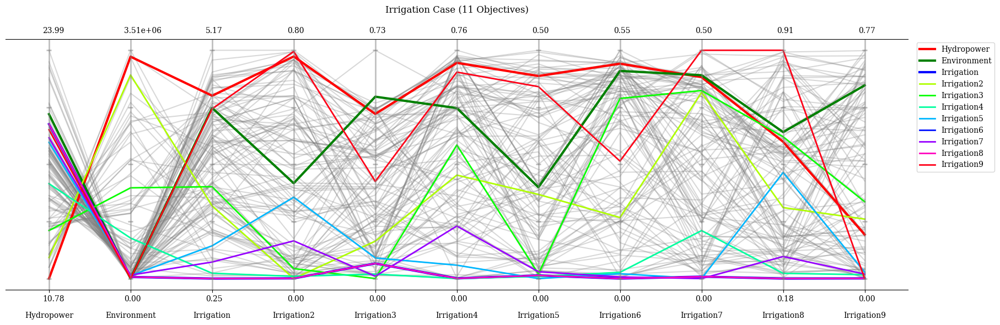

In [37]:
# This parallel plot includes all the objectives
objectives = df_irr.values

plt.figure(figsize=(12, 8), dpi=300) 

plot = PCP(legend = (True, {'loc': "upper right", 'bbox_to_anchor': (1.1, 1)}), labels=["Hydropower", "Environment", "Irrigation" ,'Irrigation2', 'Irrigation3', 'Irrigation4', 'Irrigation5', 'Irrigation6', \
        'Irrigation7', 'Irrigation8', 'Irrigation9'], title = ("Irrigation Case (11 Objectives)\n\n"), figsize=(18, 6), tight_layout = True)
plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)
hsv = cm.get_cmap('hsv', 10)

plot.add(objectives[index_h], linewidth=3, color="red", label='Hydropower')  # Red
plot.add(objectives[index_e], linewidth=3, color="green", label='Environment')  # Green
plot.add(objectives[index_i], linewidth=3, color="blue", label='Irrigation')  # Blue
plot.add(objectives[index_i2], linewidth=2, color=hsv(2), label='Irrigation2')
plot.add(objectives[index_i3], linewidth=2, color=hsv(3), label='Irrigation3')
plot.add(objectives[index_i4], linewidth=2, color=hsv(4), label='Irrigation4')
plot.add(objectives[index_i5], linewidth=2, color=hsv(5), label='Irrigation5')
plot.add(objectives[index_i6], linewidth=2, color=hsv(6), label='Irrigation6')
plot.add(objectives[index_i7], linewidth=2, color=hsv(7), label='Irrigation7')
plot.add(objectives[index_i8], linewidth=2, color=hsv(8), label='Irrigation8')
plot.add(objectives[index_i9], linewidth=2, color=hsv(9), label='Irrigation9')



print(os.getcwd())
relative_path = '../../plots'
filename = 'irr_pcp_best_all_objectives.png'

plot.show()

#plt.savefig(os.path.join(relative_path, filename))

/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/runs/IR_new_pseudo_mln_1000000nfe_5seed


<Figure size 3600x2400 with 0 Axes>

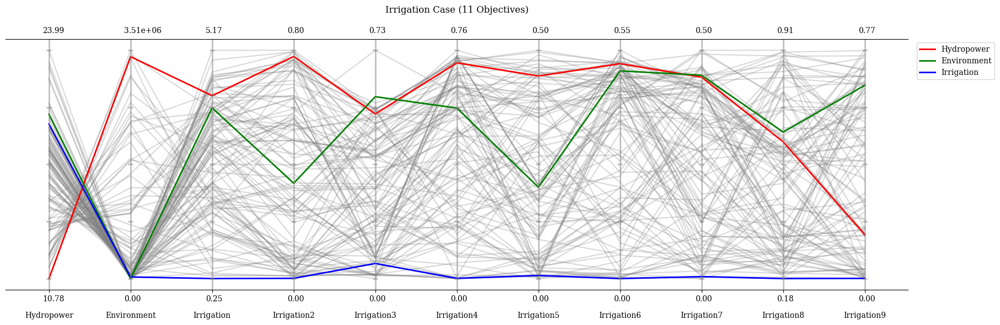

In [38]:
# This parallel plot only highlights the best solutions for the three base case objectives 
objectives = df_irr.values

plt.figure(figsize=(12, 8), dpi=300) 
plot = PCP(legend = (True, {'loc': "upper right", 'bbox_to_anchor': (1.1, 1)}), labels=["Hydropower", "Environment", "Irrigation" ,'Irrigation2', 'Irrigation3', 'Irrigation4', 'Irrigation5', 'Irrigation6', \
        'Irrigation7', 'Irrigation8', 'Irrigation9'], title = ("Irrigation Case (11 Objectives)\n\n"), figsize=(18, 6), tight_layout = True)
plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)

plot.add(objectives[index_h], linewidth=2, color="red", label = 'Hydropower')
plot.add(objectives[index_e], linewidth=2, color="green", label = 'Environment')
plot.add(objectives[index_i], linewidth=2, color="blue", label = 'Irrigation')

print(os.getcwd())
relative_path = '../../plots'
filename = 'irr_pcp_best_3obj.png'

plot.show()

#plt.savefig(os.path.join(relative_path, filename))

/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/runs/IR_new_pseudo_mln_1000000nfe_5seed


<Figure size 3000x1500 with 0 Axes>

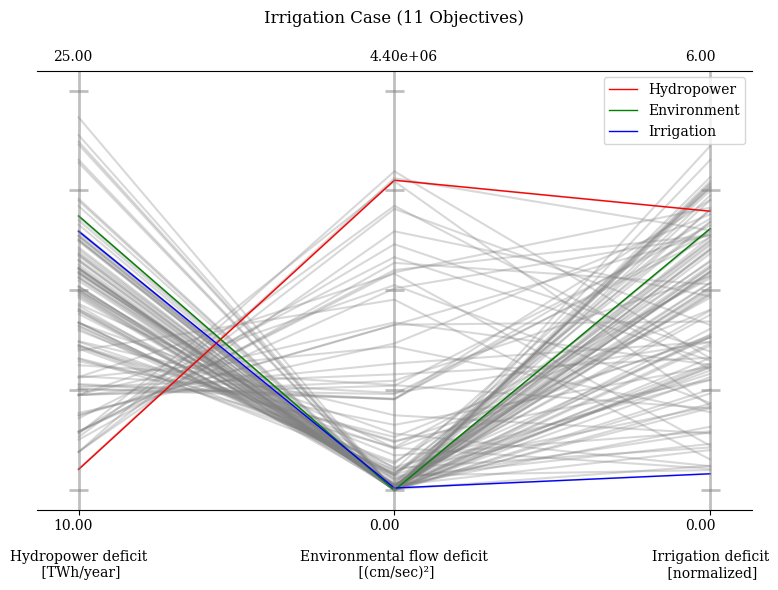

In [39]:
objectives = df_irr.values[:, :3]  # Select only the first three columns

# Set the figure size the same as for the base case
fig = plt.figure(figsize=(10, 5), dpi=300)

# Define the plot with the specific settings
plot = PCP(
    legend=(True, {'loc': "upper right"}), 
    labels=["Hydropower deficit\n [TWh/year]", "Environmental flow deficit\n [(cm/sec)\u00B2]", "Irrigation deficit\n [normalized]"], 
    title="Irrigation Case (11 Objectives)\n\n"
)

plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)

# Add the highlighted lines
plot.add(objectives[index_h][:3], linewidth=1, color="red", label='Hydropower')
plot.add(objectives[index_e][:3], linewidth=1, color="green", label='Environment')
plot.add(objectives[index_i][:3], linewidth=1, color="blue", label='Irrigation')

print(os.getcwd())
relative_path = '../../plots'
filename = 'irr_pcp_best_3obj.png'
plot.bounds=[[10,0,0],[25,4400000,6]]

plot.show()

plt.tight_layout()
plt.savefig(os.path.join(relative_path, filename))

/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/runs/IR_new_pseudo_mln_1000000nfe_5seed


/var/folders/9t/kld_mjfn78nbv1nz2xzszw980000gn/T/ipykernel_80526/4290036465.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  hsv = cm.get_cmap('hsv', 10)


<Figure size 3600x2400 with 0 Axes>

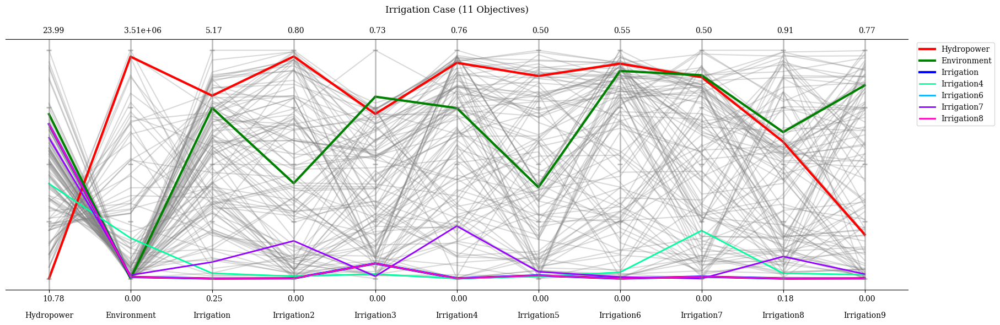

In [40]:
# This parallel plot includes all the objectives
objectives = df_irr.values

plt.figure(figsize=(12, 8), dpi=300) 

plot = PCP(legend = (True, {'loc': "upper right", 'bbox_to_anchor': (1.1, 1)}), labels=["Hydropower", "Environment", "Irrigation" ,'Irrigation2', 'Irrigation3', 'Irrigation4', 'Irrigation5', 'Irrigation6', \
        'Irrigation7', 'Irrigation8', 'Irrigation9'], title = ("Irrigation Case (11 Objectives)\n\n"), figsize=(18, 6), tight_layout = True)
plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)
hsv = cm.get_cmap('hsv', 10)

plot.add(objectives[index_h], linewidth=3, color="red", label='Hydropower')  # Red
plot.add(objectives[index_e], linewidth=3, color="green", label='Environment')  # Green
plot.add(objectives[index_i], linewidth=3, color="blue", label='Irrigation')  # Blue
plot.add(objectives[index_i4], linewidth=2, color=hsv(4), label='Irrigation4')
plot.add(objectives[index_i6], linewidth=2, color=hsv(5), label='Irrigation6')
plot.add(objectives[index_i7], linewidth=2, color=hsv(7), label='Irrigation7')
plot.add(objectives[index_i8], linewidth=2, color=hsv(8), label='Irrigation8')


print(os.getcwd())
relative_path = '../../plots'
filename = 'irr_pcp_best_all_objectives.png'

plot.show()

#plt.savefig(os.path.join(relative_path, filename))

## Save the best decisions for the simulation

# HYDROPOWER CASE
The hydropower case has 8 objectives: the 3 base objectives and the 5 hydropower reservoirs

In [41]:
if not os.path.exists("../src"):
    os.chdir("../../src")
else:
    os.chdir('../src')
os.getcwd()

'/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/src'

In [42]:
from model_zambezi_OPT_hyd import ModelZambezi

ZambeziProblem = ModelZambezi()

def model_wrapper(**kwargs):
    input = [kwargs['v' + str(i)] for i in range(len(kwargs))]
    Hydropower, Environment, Irrigation, HydropowerITT, HydropowerKGU, HydropowerKA, HydropowerCB, HydropowerKGL = tuple(ZambeziProblem.evaluate(np.array(input)))
    return Hydropower, Environment, Irrigation, HydropowerITT, HydropowerKGU, HydropowerKA, HydropowerCB, HydropowerKGL
    
# specify model
model = Model('zambeziproblem', function=model_wrapper)

# levers
model.levers = [RealParameter('v' + str(i), -1, 1) for i in range(ZambeziProblem.Nvar)]

# specify outcomes
model.outcomes = [ScalarOutcome('Hydropower', ScalarOutcome.MINIMIZE),  # Minimize, because deficits
                  ScalarOutcome('Environment', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('HydropowerITT', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('HydropowerKGU', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('HydropowerKA', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('HydropowerCB', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('HydropowerKGL', ScalarOutcome.MINIMIZE),
                  ]

#Problem definitionv
problem = to_problem(model, searchover="levers")

In [43]:
nfe = 200000 #
seeds = 5
run_comment = 'pseudo'
run_label = f"HYD_{run_comment}_{nfe}nfe_{seeds}seed" #

os.chdir(f'../runs/{run_label}')
os.getcwd()

'/Users/damlaakoluk/Zambezi-River-Basin-Multi-reservoir-EMODPS/ZambeziSmashPython/runs/HYD_pseudo_200000nfe_5seed'

In [44]:
# Load the merged results
column_names = ['Hydropower', 'Environment', 'Irrigation', 'HydropowerITT', 'HydropowerKGU', 'HydropowerKA', 'HydropowerCB', 'HydropowerKGL']
df_hyd = pd.read_csv(f"merged_results.csv", usecols = column_names)#, index_col=0)

In [45]:
df_hyd

,Hydropower,Environment,Irrigation,HydropowerITT,HydropowerKGU,HydropowerKA,HydropowerCB,HydropowerKGL
0,16.006414,8.789578e+05,2.386127,0.248372,0.591043,6.485086,7.748553,0.933360
1,23.039304,2.004724e+04,2.420071,0.464418,2.515464,7.706645,9.977515,2.375263
2,15.906323,1.561556e+06,1.149672,0.287883,1.152783,6.364572,6.751679,1.349407
3,16.162928,9.280800e+05,4.844783,0.361653,1.711042,5.807992,6.210020,2.072220
4,19.144987,1.828277e+05,1.427336,0.268418,0.716025,7.430135,9.669882,1.060526
...,...,...,...,...,...,...,...,...
89,20.009301,1.365740e+05,5.065417,0.325807,1.452162,7.547479,9.011838,1.672015
90,14.955650,2.529250e+06,0.752349,0.356308,1.129716,6.289910,5.917192,1.262524
91,17.404188,9.606141e+05,0.536133,0.283816,1.089318,6.204755,8.349772,1.476526
92,11.651073,2.797928e+06,3.708075,0.235760,0.569702,5.928908,4.051395,0.865308


In [46]:
print(df_hyd.columns)

Index(['Hydropower', 'Environment', 'Irrigation', 'HydropowerITT',
       'HydropowerKGU', 'HydropowerKA', 'HydropowerCB', 'HydropowerKGL'],
      dtype='object')


## 3d plot

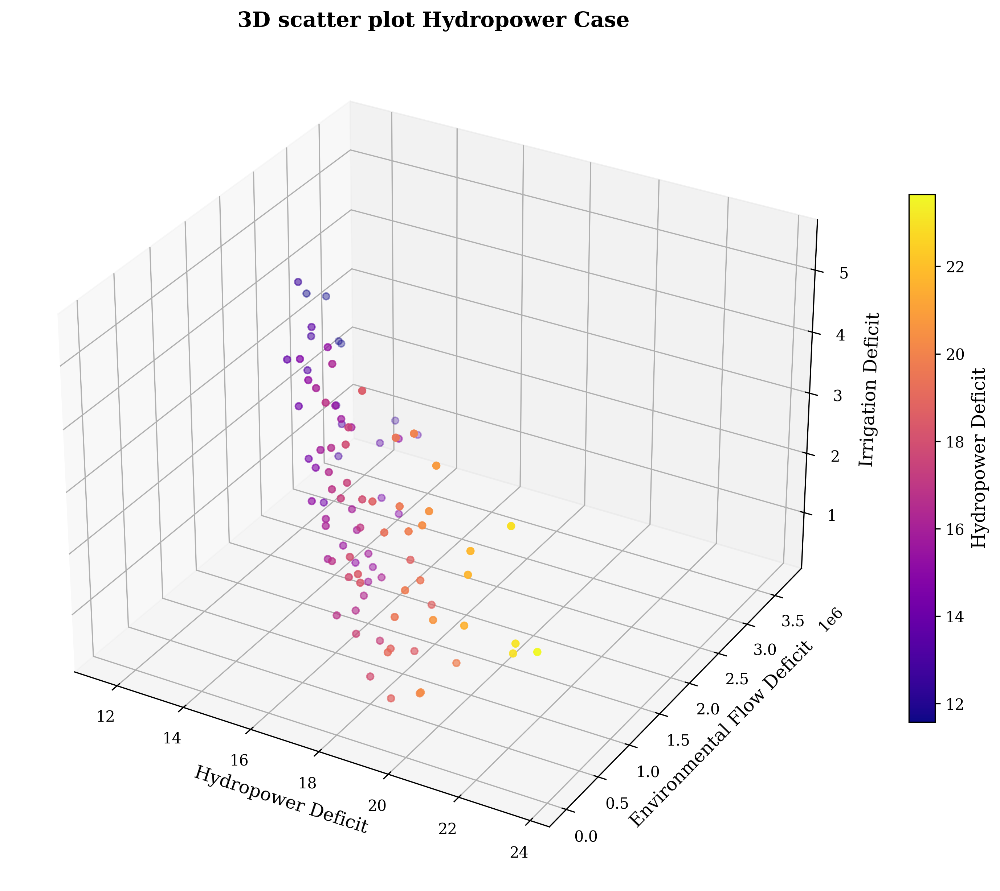

In [47]:
# Create a 3D plot
outcomes = df_hyd

fig = plt.figure(figsize=(10, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(outcomes['Hydropower'], outcomes['Environment'], outcomes['Irrigation'], 
                c=outcomes['Hydropower'], cmap='plasma', marker='o')

# Add color bar
cbar = plt.colorbar(sc, ax=ax, shrink=0.5, aspect=20)
cbar.set_label('Hydropower Deficit', fontsize=12)

# Set axis labels
ax.set_xlabel('Hydropower Deficit', fontsize=12)
ax.set_ylabel('Environmental Flow Deficit', fontsize=12)
ax.set_zlabel('Irrigation Deficit', fontsize=12)

# Set title
ax.set_title('3D scatter plot Hydropower Case', fontsize=14, fontweight='bold')

# Add grid for better visualization
ax.grid(True)

# Adjust layout
plt.tight_layout()

# Save the plot to the specified relative path and filename
relative_path = '../../plots'
#if not os.path.exists(relative_path):
#    print('no path')
filename = 'hyd_3D.png'
plt.savefig(os.path.join(relative_path, filename), bbox_inches='tight', dpi=300)

# Show the plot
plt.show()

## Parallel plot

In [48]:
def get_min_index(df, column):
    # Find all rows with the minimum value for this column
    min_rows = df[df[column] == df[column].min()]
    # Find the row with lowest value across all columns
    min_index = min_rows.apply(np.min, axis=1).idxmin()
    
    return min_index

index_h = get_min_index(df_hyd, 'Hydropower')
index_e = get_min_index(df_hyd, 'Environment')
index_i = get_min_index(df_hyd, 'Irrigation')
index_h1 = get_min_index(df_hyd, 'HydropowerITT')
index_h2 = get_min_index(df_hyd, 'HydropowerKGU')
index_h3 = get_min_index(df_hyd, 'HydropowerKGL')
index_h4 = get_min_index(df_hyd, 'HydropowerKA')
index_h5 = get_min_index(df_hyd, 'HydropowerCB')


In [54]:
# This plot is used for interpretation
hyd_hiplot = hip.Experiment.from_dataframe(df_hyd)
hyd_hiplot.display()

<IPython.core.display.Javascript object>

C:\Users\whitl\AppData\Local\Temp\ipykernel_12136\737132156.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  hsv = cm.get_cmap('hsv', 7)


C:\Users\whitl\OneDrive\Documenten\MASTER\Year 2\THESIS\16.02.22.Multiobjective\Multiobjective-multi-reservoir-control-d50e4da0f6a9a9c852b4904e640299adc96714bb\ZambeziSmashPython\runs\HYD_pseudo_200000nfe_5seed


<Figure size 3600x2400 with 0 Axes>

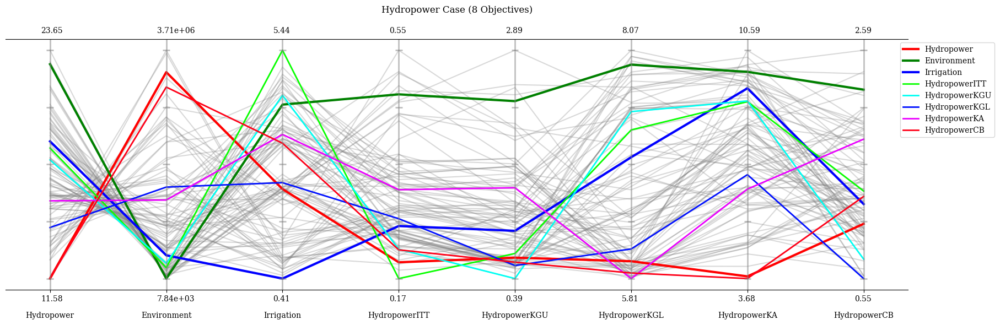

In [55]:
# This parallel plot includes all the objectives
objectives = df_hyd.values

plt.figure(figsize=(12, 8), dpi=300) 

plot = PCP(legend = (True, {'loc': "upper right", 'bbox_to_anchor': (1.1, 1)}), labels=['Hydropower', 
                    'Environment', 'Irrigation', 'HydropowerITT', 'HydropowerKGU', 'HydropowerKGL', 'HydropowerKA', 'HydropowerCB'], 
                    title = ("Hydropower Case (8 Objectives)\n\n"), figsize=(18, 6), tight_layout = True)
plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)
hsv = cm.get_cmap('hsv', 7)

plot.add(objectives[index_h], linewidth=3, color="red", label='Hydropower')  # Red
plot.add(objectives[index_e], linewidth=3, color="green", label='Environment')  # Green
plot.add(objectives[index_i], linewidth=3, color="blue", label='Irrigation')  # Blue
plot.add(objectives[index_h1], linewidth=2, color=hsv(2), label='HydropowerITT')
plot.add(objectives[index_h2], linewidth=2, color=hsv(3), label='HydropowerKGU')
plot.add(objectives[index_h3], linewidth=2, color=hsv(4), label='HydropowerKGL')
plot.add(objectives[index_h4], linewidth=2, color=hsv(5), label='HydropowerKA')
plot.add(objectives[index_h5], linewidth=2, color=hsv(6), label='HydropowerCB')

print(os.getcwd())
relative_path = '../../plots'
filename = 'hyd_pcp_best_all_objectives.png'

plot.show()

#plt.savefig(os.path.join(relative_path, filename))

C:\Users\whitl\OneDrive\Documenten\MASTER\Year 2\THESIS\16.02.22.Multiobjective\Multiobjective-multi-reservoir-control-d50e4da0f6a9a9c852b4904e640299adc96714bb\ZambeziSmashPython\runs\HYD_pseudo_200000nfe_5seed


<Figure size 3600x2400 with 0 Axes>

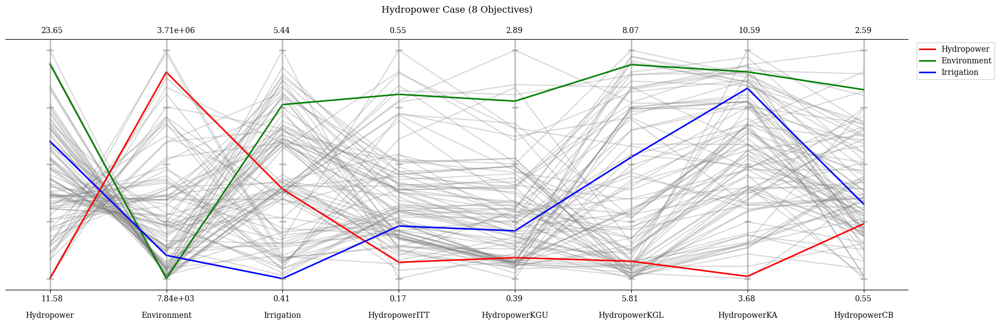

In [56]:
# This parallel plot only highlights the best solutions for the three base case objectives 
objectives = df_hyd.values

plt.figure(figsize=(12, 8), dpi=300) 
plot = PCP(legend = (True, {'loc': "upper right", 'bbox_to_anchor': (1.1, 1)}), labels=['Hydropower', 'Environment', 'Irrigation', 'HydropowerITT', 
                    'HydropowerKGU', 'HydropowerKGL', 'HydropowerKA', 'HydropowerCB'], title = ("Hydropower Case (8 Objectives)\n\n"), figsize=(18, 6), 
                    tight_layout = True)
plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)

plot.add(objectives[index_h], linewidth=2, color="red", label = 'Hydropower')
plot.add(objectives[index_e], linewidth=2, color="green", label = 'Environment')
plot.add(objectives[index_i], linewidth=2, color="blue", label = 'Irrigation')

print(os.getcwd())
relative_path = '../../plots'
filename = 'hyd_pcp_best_3obj.png'

plot.show()

plt.savefig(os.path.join(relative_path, filename))

C:\Users\whitl\OneDrive\Documenten\MASTER\Year 2\THESIS\16.02.22.Multiobjective\Multiobjective-multi-reservoir-control-d50e4da0f6a9a9c852b4904e640299adc96714bb\ZambeziSmashPython\runs\HYD_pseudo_200000nfe_5seed


<Figure size 3000x1500 with 0 Axes>

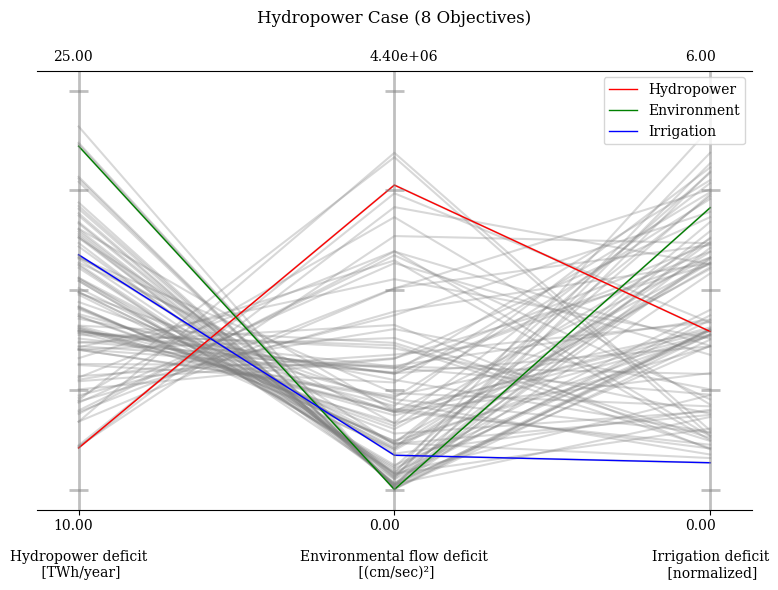

In [57]:
objectives = df_hyd.values[:, :3]  # Select only the first three columns

# Set the figure size the same as for the base case
fig = plt.figure(figsize=(10, 5), dpi=300)

# Define the plot with the specific settings
plot = PCP(
    legend=(True, {'loc': "upper right"}), 
    labels=["Hydropower deficit\n [TWh/year]", "Environmental flow deficit\n [(cm/sec)\u00B2]", "Irrigation deficit\n [normalized]"], 
    title="Hydropower Case (8 Objectives)\n\n",
)

plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)

# Add the highlighted lines
plot.add(objectives[index_h][:3], linewidth=1, color="red", label='Hydropower')
plot.add(objectives[index_e][:3], linewidth=1, color="green", label='Environment')
plot.add(objectives[index_i][:3], linewidth=1, color="blue", label='Irrigation')

print(os.getcwd())
relative_path = '../../plots'
filename = 'hyd_pcp_best_3obj.png'
plot.bounds=[[10,0,0],[25,4400000,6]]
plot.show()
plt.tight_layout()
plt.savefig(os.path.join(relative_path, filename))

C:\Users\whitl\AppData\Local\Temp\ipykernel_12136\240187331.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  hsv = cm.get_cmap('hsv', 7)


C:\Users\whitl\OneDrive\Documenten\MASTER\Year 2\THESIS\16.02.22.Multiobjective\Multiobjective-multi-reservoir-control-d50e4da0f6a9a9c852b4904e640299adc96714bb\ZambeziSmashPython\runs\HYD_pseudo_200000nfe_5seed


<Figure size 3600x2400 with 0 Axes>

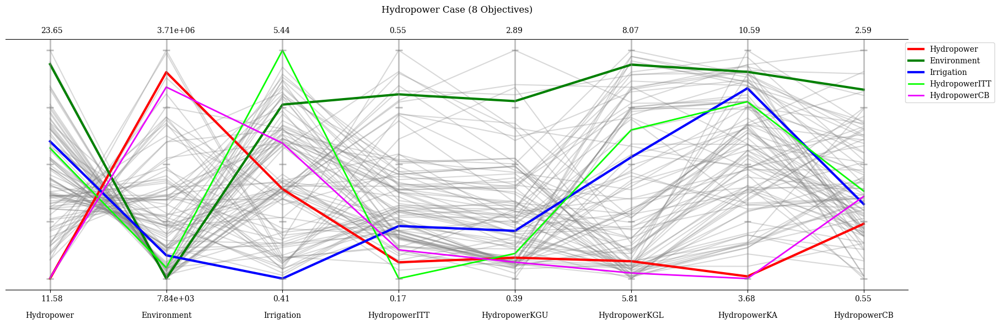

In [58]:
# This parallel plot includes all the objectives
objectives = df_hyd.values

plt.figure(figsize=(12, 8), dpi=300) 

plot = PCP(legend = (True, {'loc': "upper right", 'bbox_to_anchor': (1.1, 1)}), labels=['Hydropower', 
                    'Environment', 'Irrigation', 'HydropowerITT', 'HydropowerKGU', 'HydropowerKGL', 'HydropowerKA', 'HydropowerCB'], 
                    title = ("Hydropower Case (8 Objectives)\n\n"), figsize=(18, 6), tight_layout = True)
plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)
hsv = cm.get_cmap('hsv', 7)

plot.add(objectives[index_h], linewidth=3, color="red", label='Hydropower')  # Red
plot.add(objectives[index_e], linewidth=3, color="green", label='Environment')  # Green
plot.add(objectives[index_i], linewidth=3, color="blue", label='Irrigation')  # Blue
plot.add(objectives[index_h1], linewidth=2, color=hsv(2), label='HydropowerITT')
plot.add(objectives[index_h5], linewidth=2, color=hsv(5), label='HydropowerCB')

print(os.getcwd())
relative_path = '../../plots'
filename = 'hyd_pcp_best_all_objectives.png'

plot.show()

#plt.savefig(os.path.join(relative_path, filename))

## Saving the best solutions for the simulation 

In [60]:
# Load the merged results
df = pd.read_csv("merged_results.csv")

column_names = ['Hydropower', 'Environment', 'Irrigation', 'HydropowerITT', 'HydropowerKGU', 'HydropowerKA', 'HydropowerCB', 'HydropowerKGL']

df_hyd = df[column_names]

# Create a dataframe without the objectives columns for the simulation
df_v = pd.read_csv("merged_results.csv", usecols=lambda x: x not in column_names )
#print(df_v)

# Extract the rows of the best solutions
best_hyd_row = df_v.loc[[index_h]]
best_env_row = df_v.loc[[index_e]]
best_irr_row = df_v.loc[[index_i]]
best_hydITT_row = df_v.loc[[index_h1]]
best_hydKGU_row = df_v.loc[[index_h2]]
best_hydKA_row = df_v.loc[[index_h4]]
best_hydCB_row = df_v.loc[[index_h5]]
best_hydKGL_row = df_v.loc[[index_h3]]
print(best_hyd_row)

#Save the best decisions for the simulation
cwd = os.getcwd()
os.chdir("../../decisions")
os.getcwd()
path = f'./hyd/'
if not os.path.exists(path):
    os.makedirs(path)
os.chdir(path)
best_hyd_row.to_csv("decisions_best_hydro.txt", index=False, header=None, sep='\n')
best_env_row.to_csv("decisions_best_env.txt", index=False, header=None, sep='\n')
best_irr_row.to_csv("decisions_best_irr.txt", index=False, header=None, sep='\n')
best_hydITT_row.to_csv("decisions_best_hydITT.txt", index=False, header=None, sep='\n')
best_hydKGU_row.to_csv("decisions_best_hydKGU.txt", index=False, header=None, sep='\n')
best_hydKA_row.to_csv("decisions_best_hydKA.txt", index=False, header=None, sep='\n')
best_hydCB_row.to_csv("decisions_best_hydCB.txt", index=False, header=None, sep='\n')
best_hydKGL_row.to_csv("decisions_best_hydKGL.txt", index=False, header=None, sep='\n')
os.chdir(cwd)

          v0        v1        v2        v3        v4        v5        v6  \
52 -0.780728  0.903269 -0.371835 -0.610161  0.945102  0.955472  0.895885   

          v7        v8        v9  ...      v220      v221      v222      v223  \
52  0.139332  0.944306  0.727345  ...  0.488528  0.586018  0.618305  0.998283   

        v224      v225      v226      v227      v228     v229  
52 -0.065172 -0.236412  0.946282  0.851902  0.087536 -0.14731  

[1 rows x 230 columns]


# FULL DISAGGREGATION CASE

In [62]:
if not os.path.exists("../src"):
    os.chdir("../../src")
else:
    os.chdir('../src')
os.getcwd()

from model_zambezi_OPT_full import ModelZambezi

ZambeziProblem = ModelZambezi()

def model_wrapper(**kwargs):
    input = [kwargs['v' + str(i)] for i in range(len(kwargs))]
    Hydropower, Environment, Irrigation, Irrigation2, Irrigation3, Irrigation4, Irrigation5, Irrigation6, Irrigation7,\
        Irrigation8, Irrigation9, HydropowerITT, HydropowerKGU, HydropowerKA, HydropowerCB, HydropowerKGL = \
        tuple(ZambeziProblem.evaluate(np.array(input)))
    return Hydropower, Environment, Irrigation, Irrigation2, Irrigation3, Irrigation4, Irrigation5, Irrigation6, \
        Irrigation7, Irrigation8, Irrigation9, HydropowerITT, HydropowerKGU, HydropowerKA, HydropowerCB, HydropowerKGL

# specify model
model = Model('zambeziproblem', function=model_wrapper)

# levers
model.levers = [RealParameter('v' + str(i), -1, 1) for i in range(ZambeziProblem.Nvar)]

# specify outcomes
model.outcomes = [ScalarOutcome('Hydropower', ScalarOutcome.MINIMIZE),  # Minimize, because deficits
                  ScalarOutcome('Environment', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation2', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation3', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation4', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation5', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation6', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation7', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation8', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('Irrigation9', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('HydropowerITT', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('HydropowerKGU', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('HydropowerKA', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('HydropowerCB', ScalarOutcome.MINIMIZE),
                  ScalarOutcome('HydropowerKGL', ScalarOutcome.MINIMIZE),
                  ]
#Problem definitionv
problem = to_problem(model, searchover="levers")

In [63]:
nfe = 1000000 #
seeds = 1
nth_list = ['1st','2nd','3rd','4th','5th']
column_names = ['Hydropower', 'Environment', 'Irrigation' ,'Irrigation2', 'Irrigation3', 'Irrigation4', 'Irrigation5', 
                'Irrigation6', 'Irrigation7','Irrigation8', 'Irrigation9', 'HydropowerITT', 'HydropowerKGU', 'HydropowerKA', 
                'HydropowerCB', 'HydropowerKGL']
run_folder_path = f'../runs' 

In [64]:

results_list = []

for i in nth_list:
    run_label = f"FULL_pseudo_mln_{i}_seed_{nfe}nfe_{seeds}seed"
    
    result = pd.read_csv(os.path.join(run_folder_path, run_label, f"results_seed0.csv")) # Create the results list, containing dataframes with the results per seed 
    
    results_list.append(result)
    #globals()[f'df_{i}'] = pd.read_csv(f"results_seed{i}.csv", usecols = column_names) # create dataframes per seed with results for analysis
        #archives.items()[nfe] =
        #archives = archives.loc[:, ~archives.columns.str.contains('^Unnamed')]
    #results_list.append(result)



In [65]:
mln_run_file_name = 'FULL_pseudo_mln_1000000nfe_5seed'

relative_path = os.path.join(run_folder_path, mln_run_file_name)

if not os.path.exists(relative_path):
    os.makedirs(relative_path)
    
os.chdir(relative_path)

In [66]:
#############
# MERGE SEEDS
#############

# Merge the 5 runs of the optimization
problem = to_problem(model, searchover="levers")
epsilons = [1.5] * len(model.outcomes)
merged_results = epsilon_nondominated(results_list, epsilons, problem)

print('merged_results', merged_results, 'saved to: ', os.getcwd())

# Save the results
merged_results_name = 'merged_results.csv'
cwd = os.getcwd()
merged_results.to_csv(os.path.join(cwd, merged_results_name), index=False)

merged_results           v0        v1        v2        v3        v4        v5        v6  \
0   0.919346  0.559469  0.794086  0.541495  0.987661  0.504531  0.271590   
1   0.894411  0.572597  0.768614  0.527890  0.944721  0.531729  0.338645   
2   0.833240  0.711793  0.884831  0.503308  0.992470  0.679812  0.615957   
3   0.381577  0.927658  0.896440  1.000000  0.989118  0.612669  0.430121   
4   0.591917  0.562987  0.904777  0.323023  0.953995  0.173297  0.615244   
..       ...       ...       ...       ...       ...       ...       ...   
91  0.332400 -0.146880  0.715352  0.236077  0.145289  0.604346  0.157848   
92  0.473429  0.727305  0.868343  0.477419  0.704653  0.701444  0.188145   
93  0.473429  0.710033  0.868343  0.473622  0.704653  0.699167  0.188145   
94  0.826661  0.984318 -0.584245  0.070314  0.942440  0.847764  0.483307   
95  0.366393  0.702393  0.850267  0.637679  0.825265  0.472159  0.574274   

          v7        v8        v9  ...  Irrigation5  Irrigation6  Irrigat

In [67]:
column_names = ['Hydropower', 'Environment', 'Irrigation' ,'Irrigation2', 'Irrigation3', 'Irrigation4', 'Irrigation5', 
                'Irrigation6', 'Irrigation7','Irrigation8', 'Irrigation9', 'HydropowerITT', 'HydropowerKGU', 'HydropowerKA', 
                'HydropowerCB', 'HydropowerKGL']
df_full = pd.read_csv(f"merged_results.csv", usecols = column_names)#, index_col=0) #, usecols = column_names)

In [68]:
df_full

,Hydropower,Environment,Irrigation,Irrigation2,Irrigation3,Irrigation4,Irrigation5,Irrigation6,Irrigation7,Irrigation8,Irrigation9,HydropowerITT,HydropowerKGU,HydropowerKA,HydropowerCB,HydropowerKGL
0,16.284332,5.237329e+05,3.036546,0.615845,0.260868,0.408332,0.126881,0.241549,0.108333,0.742431,0.532306,0.361619,1.135639,5.807007,7.626287,1.353780
1,14.128706,1.655419e+06,3.209693,0.618603,0.240870,0.416459,0.160030,0.255528,0.445833,0.606309,0.466061,0.321969,1.054735,5.808018,5.591882,1.352103
2,18.746459,1.505523e+05,3.164639,0.661466,0.269499,0.575105,0.227064,0.159458,0.029167,0.844658,0.398223,0.553108,1.577166,5.810903,8.998745,1.806536
3,13.487563,2.000900e+06,3.887484,0.569483,0.539164,0.491639,0.117217,0.424088,0.479167,0.792058,0.474668,0.252777,0.692461,5.866534,5.594641,1.081150
4,21.307448,2.761444e+03,2.713000,0.513842,0.161845,0.123164,0.341323,0.142029,0.433333,0.877966,0.119498,0.498219,2.033168,5.825294,10.924449,2.026318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,18.392878,4.036521e+05,1.462457,0.020329,0.178627,0.016490,0.118933,0.665416,0.175000,0.241667,0.045996,0.236038,0.917549,7.093395,8.709426,1.436470
92,18.608404,8.000481e+04,3.146797,0.548568,0.665673,0.457819,0.057393,0.704920,0.054167,0.245833,0.412424,0.246828,0.552363,7.863803,9.398783,0.546627
93,17.948755,3.162776e+05,2.791660,0.542160,0.621676,0.454713,0.061377,0.364635,0.100000,0.241667,0.405433,0.247980,0.538304,7.488675,9.085197,0.588599
94,21.191246,4.755550e+04,4.336071,0.754353,0.815776,0.656305,0.236411,0.403915,0.050000,0.892736,0.526574,0.403699,1.285405,8.120851,9.691306,1.689985


In [69]:
df_full.min()

Hydropower       1.154085e+01
Environment      0.000000e+00
Irrigation       3.030716e-01
Irrigation2      0.000000e+00
Irrigation3      0.000000e+00
Irrigation4      8.973215e-07
Irrigation5      2.061180e-05
Irrigation6      7.396450e-05
Irrigation7      0.000000e+00
Irrigation8      1.541667e-01
Irrigation9      4.260290e-04
HydropowerITT    1.847824e-01
HydropowerKGU    4.682298e-01
HydropowerKA     5.801181e+00
HydropowerCB     3.923989e+00
HydropowerKGL    5.204233e-01
dtype: float64

In [70]:
print(df_full.columns)

Index(['Hydropower', 'Environment', 'Irrigation', 'Irrigation2', 'Irrigation3',
       'Irrigation4', 'Irrigation5', 'Irrigation6', 'Irrigation7',
       'Irrigation8', 'Irrigation9', 'HydropowerITT', 'HydropowerKGU',
       'HydropowerKA', 'HydropowerCB', 'HydropowerKGL'],
      dtype='object')


## 3d plot

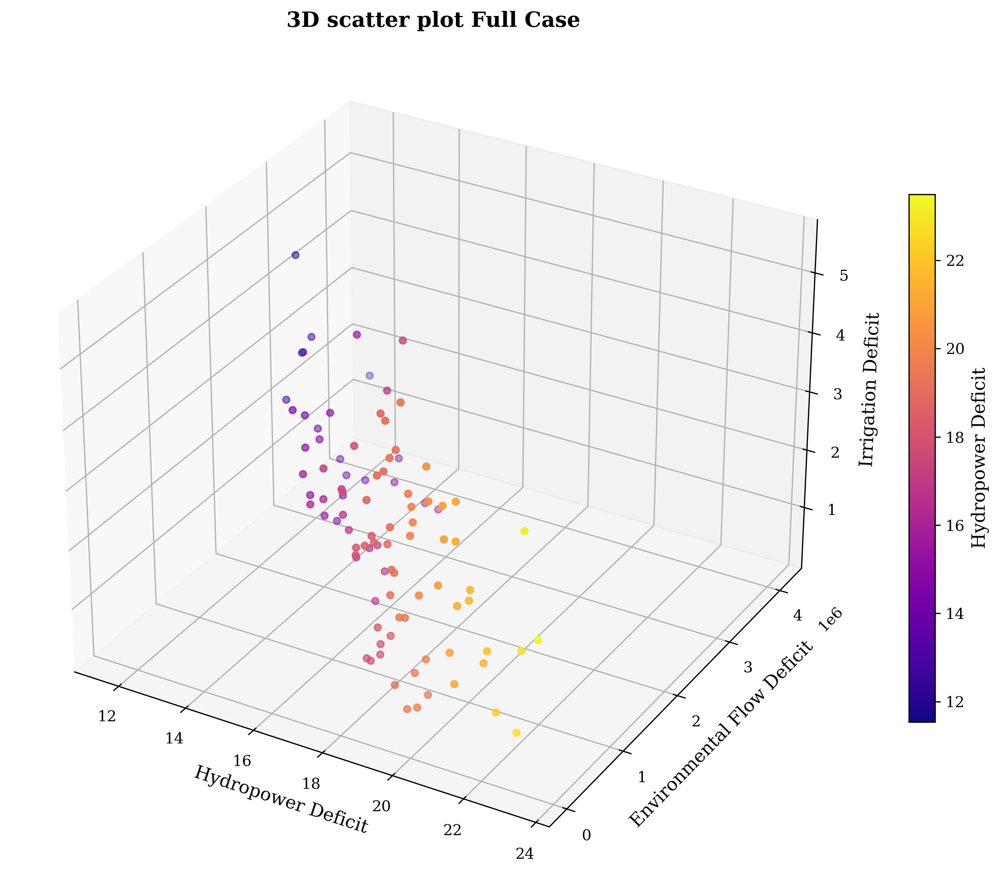

In [72]:
# Create a 3D plot
outcomes = df_full

fig = plt.figure(figsize=(10, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(outcomes['Hydropower'], outcomes['Environment'], outcomes['Irrigation'], 
                c=outcomes['Hydropower'], cmap='plasma', marker='o')

# Add color bar
cbar = plt.colorbar(sc, ax=ax, shrink=0.5, aspect=20)
cbar.set_label('Hydropower Deficit', fontsize=12)

# Set axis labels
ax.set_xlabel('Hydropower Deficit', fontsize=12)
ax.set_ylabel('Environmental Flow Deficit', fontsize=12)
ax.set_zlabel('Irrigation Deficit', fontsize=12)

# Set title
ax.set_title('3D scatter plot Full Case', fontsize=14, fontweight='bold')

# Add grid for better visualization
ax.grid(True)

# Adjust layout
plt.tight_layout()

# Save the plot to the specified relative path and filename
relative_path = '../../plots'
#if not os.path.exists(relative_path):
#    print('no path')
filename = 'full_3D.png'
plt.savefig(os.path.join(relative_path, filename), bbox_inches='tight', dpi=300)

# Show the plot
plt.show()

## Parallel plot

In [74]:
def get_min_index(df, column):
    # Find all rows with the minimum value for this column
    min_rows = df[df[column] == df[column].min()]
    # Find the row with lowest value across all columns
    min_index = min_rows.apply(np.min, axis=1).idxmin()
    
    return min_index

index_h = get_min_index(df_full, 'Hydropower')
index_e = get_min_index(df_full, 'Environment')
index_i = get_min_index(df_full, 'Irrigation')
index_i2 = get_min_index(df_full, 'Irrigation2')
index_i3 = get_min_index(df_full, 'Irrigation3')
index_i4 = get_min_index(df_full, 'Irrigation4')
index_i5 = get_min_index(df_full, 'Irrigation5')
index_i6 = get_min_index(df_full, 'Irrigation6')
index_i7 = get_min_index(df_full, 'Irrigation7')
index_i8 = get_min_index(df_full, 'Irrigation8')
index_i9 = get_min_index(df_full, 'Irrigation9')
index_h1 = get_min_index(df_full, 'HydropowerITT')
index_h2 = get_min_index(df_full, 'HydropowerKGU')
index_h3 = get_min_index(df_full, 'HydropowerKGL')
index_h4 = get_min_index(df_full, 'HydropowerKA')
index_h5 = get_min_index(df_full, 'HydropowerCB')

In [75]:
full_hiplot = hip.Experiment.from_dataframe(df_full)
full_hiplot.display()

<IPython.core.display.Javascript object>

C:\Users\whitl\AppData\Local\Temp\ipykernel_12136\3711312224.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  hsv = cm.get_cmap('hsv', 20)


C:\Users\whitl\OneDrive\Documenten\MASTER\Year 2\THESIS\16.02.22.Multiobjective\Multiobjective-multi-reservoir-control-d50e4da0f6a9a9c852b4904e640299adc96714bb\ZambeziSmashPython\runs\FULL_pseudo_mln_1000000nfe_5seed


<Figure size 3600x2400 with 0 Axes>

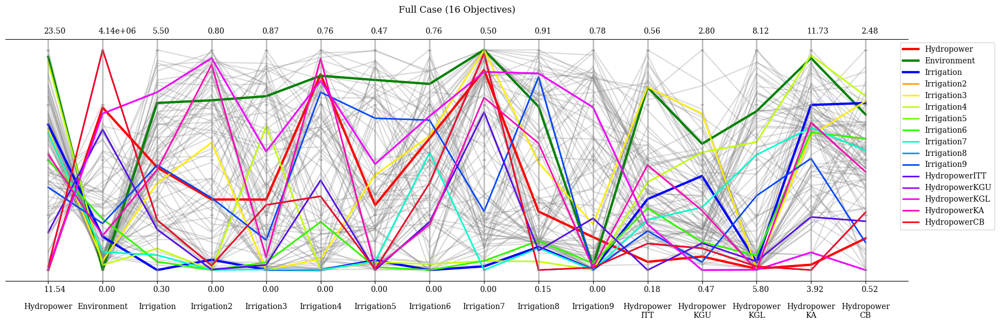

In [76]:
# This parallel plot includes all the objectives
objectives = df_full.values

plt.figure(figsize=(12, 8), dpi=300) 

plot = PCP(legend = (True, {'loc': "upper right", 'bbox_to_anchor': (1.1, 1)}), labels=['Hydropower', 'Environment', 'Irrigation' ,'Irrigation2', 
                    'Irrigation3', 'Irrigation4', 'Irrigation5', 'Irrigation6', 'Irrigation7','Irrigation8', 'Irrigation9', 'Hydropower\nITT', 
                    'Hydropower\nKGU', 'Hydropower\nKGL', 'Hydropower\nKA', 'Hydropower\nCB'], title = ("Full Case (16 Objectives)\n\n"), figsize=(18, 6), 
                    tight_layout = True)
plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)
hsv = cm.get_cmap('hsv', 20)

plot.add(objectives[index_h], linewidth=3, color="red", label='Hydropower')  # Red
plot.add(objectives[index_e], linewidth=3, color="green", label='Environment')  # Green
plot.add(objectives[index_i], linewidth=3, color="blue", label='Irrigation')  # Blue
plot.add(objectives[index_i2], linewidth=2, color=hsv(2), label='Irrigation2')
plot.add(objectives[index_i3], linewidth=2, color=hsv(3), label='Irrigation3')
plot.add(objectives[index_i4], linewidth=2, color=hsv(4), label='Irrigation4')
plot.add(objectives[index_i5], linewidth=2, color=hsv(5), label='Irrigation5')
plot.add(objectives[index_i6], linewidth=2, color=hsv(6), label='Irrigation6')
plot.add(objectives[index_i7], linewidth=2, color=hsv(9), label='Irrigation7')
plot.add(objectives[index_i8], linewidth=2, color=hsv(11), label='Irrigation8')
plot.add(objectives[index_i9], linewidth=2, color=hsv(12), label='Irrigation9')
plot.add(objectives[index_h1], linewidth=2, color=hsv(14), label='HydropowerITT')
plot.add(objectives[index_h2], linewidth=2, color=hsv(15), label='HydropowerKGU')
plot.add(objectives[index_h3], linewidth=2, color=hsv(16), label='HydropowerKGL')
plot.add(objectives[index_h4], linewidth=2, color=hsv(17), label='HydropowerKA')
plot.add(objectives[index_h5], linewidth=2, color=hsv(19), label='HydropowerCB')

print(os.getcwd())
relative_path = '../../plots'
filename = 'full_pcp_best_all_objectives.png'

plot.show()

#plt.savefig(os.path.join(relative_path, filename))

C:\Users\whitl\OneDrive\Documenten\MASTER\Year 2\THESIS\16.02.22.Multiobjective\Multiobjective-multi-reservoir-control-d50e4da0f6a9a9c852b4904e640299adc96714bb\ZambeziSmashPython\runs\FULL_pseudo_mln_1000000nfe_5seed


<Figure size 3600x2400 with 0 Axes>

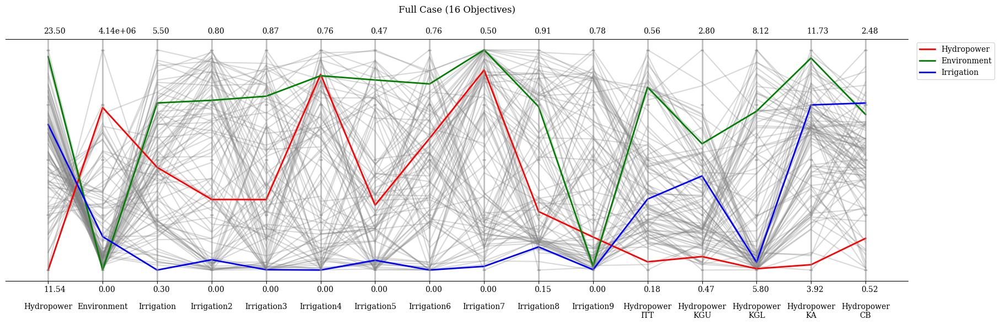

In [77]:
# This parallel plot only highlights the best solutions for the three base case objectives 
objectives = df_full.values

plt.figure(figsize=(12, 8), dpi=300) 
plot = PCP(legend = (True, {'loc': "upper right", 'bbox_to_anchor': (1.1, 1)}), labels=['Hydropower', 'Environment', 'Irrigation' ,'Irrigation2', 
                    'Irrigation3', 'Irrigation4', 'Irrigation5', 'Irrigation6', 'Irrigation7','Irrigation8', 'Irrigation9', 'Hydropower\nITT', 
                    'Hydropower\nKGU', 'Hydropower\nKGL', 'Hydropower\nKA', 'Hydropower\nCB'], title = ("Full Case (16 Objectives)\n\n"), figsize=(18, 6), 
                    tight_layout = True)
plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)

plot.add(objectives[index_h], linewidth=2, color="red", label = 'Hydropower')
plot.add(objectives[index_e], linewidth=2, color="green", label = 'Environment')
plot.add(objectives[index_i], linewidth=2, color="blue", label = 'Irrigation')

print(os.getcwd())
relative_path = '../../plots'
filename = 'full_pcp_best_3obj.png'

plot.show()

plt.savefig(os.path.join(relative_path, filename))

In [78]:
os.getcwd()

'C:\\Users\\whitl\\OneDrive\\Documenten\\MASTER\\Year 2\\THESIS\\16.02.22.Multiobjective\\Multiobjective-multi-reservoir-control-d50e4da0f6a9a9c852b4904e640299adc96714bb\\ZambeziSmashPython\\runs\\FULL_pseudo_mln_1000000nfe_5seed'

C:\Users\whitl\AppData\Local\Temp\ipykernel_12136\2392654325.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  hsv = cm.get_cmap('hsv', 20)


C:\Users\whitl\OneDrive\Documenten\MASTER\Year 2\THESIS\16.02.22.Multiobjective\Multiobjective-multi-reservoir-control-d50e4da0f6a9a9c852b4904e640299adc96714bb\ZambeziSmashPython\runs\FULL_pseudo_mln_1000000nfe_5seed


<Figure size 3600x2400 with 0 Axes>

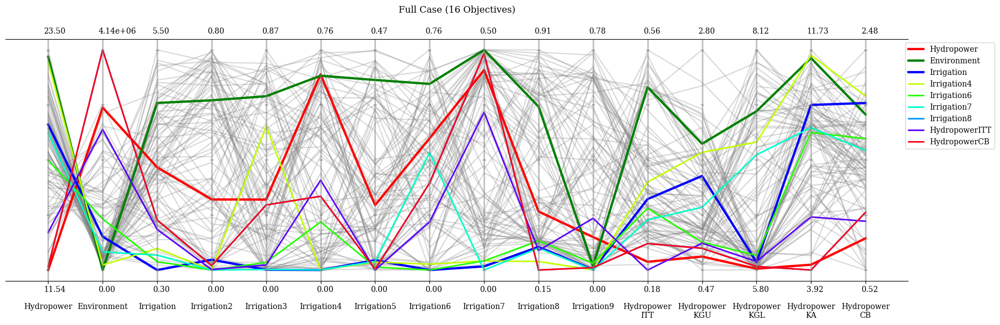

In [79]:
# This parallel plot includes all the objectives
objectives = df_full.values

plt.figure(figsize=(12, 8), dpi=300) 

plot = PCP(legend = (True, {'loc': "upper right", 'bbox_to_anchor': (1.1, 1)}), labels=['Hydropower', 'Environment', 'Irrigation' ,'Irrigation2', 
                    'Irrigation3', 'Irrigation4', 'Irrigation5', 'Irrigation6', 'Irrigation7','Irrigation8', 'Irrigation9', 'Hydropower\nITT', 
                    'Hydropower\nKGU', 'Hydropower\nKGL', 'Hydropower\nKA', 'Hydropower\nCB'], title = ("Full Case (16 Objectives)\n\n"), figsize=(18, 6), 
                    tight_layout = True)
plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)
hsv = cm.get_cmap('hsv', 20)

plot.add(objectives[index_h], linewidth=3, color="red", label='Hydropower')  # Red
plot.add(objectives[index_e], linewidth=3, color="green", label='Environment')  # Green
plot.add(objectives[index_i], linewidth=3, color="blue", label='Irrigation')  # Blue
plot.add(objectives[index_i4], linewidth=2, color=hsv(4), label='Irrigation4')
plot.add(objectives[index_i6], linewidth=2, color=hsv(6), label='Irrigation6')
plot.add(objectives[index_i7], linewidth=2, color=hsv(9), label='Irrigation7')
plot.add(objectives[index_i8], linewidth=2, color=hsv(11), label='Irrigation8')
plot.add(objectives[index_h1], linewidth=2, color=hsv(14), label='HydropowerITT')
plot.add(objectives[index_h5], linewidth=2, color=hsv(19), label='HydropowerCB')

print(os.getcwd())
relative_path = '../../plots'
filename = 'full_pcp_best_all_objectives.png'

plot.show()

#plt.savefig(os.path.join(relative_path, filename))

C:\Users\whitl\OneDrive\Documenten\MASTER\Year 2\THESIS\16.02.22.Multiobjective\Multiobjective-multi-reservoir-control-d50e4da0f6a9a9c852b4904e640299adc96714bb\ZambeziSmashPython\runs\FULL_pseudo_mln_1000000nfe_5seed


<Figure size 1500x4500 with 0 Axes>

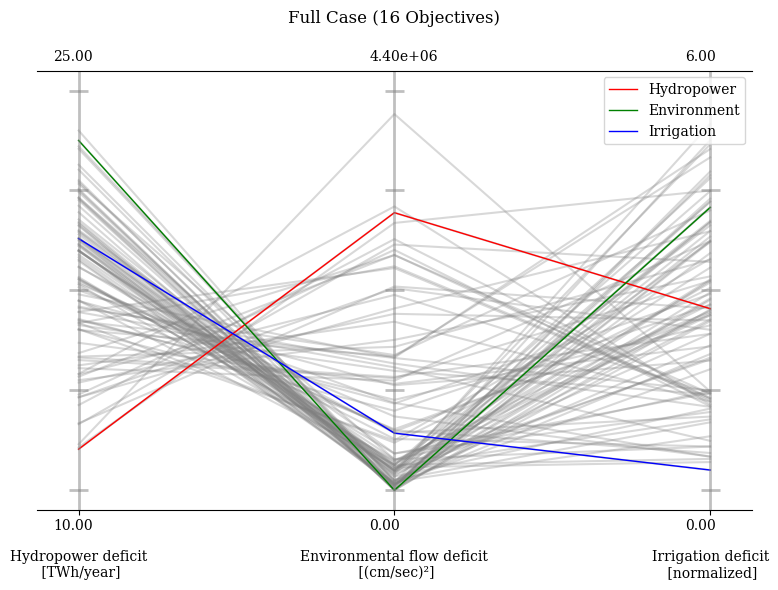

In [80]:
objectives = df_full.values[:, :3]  # Select only the first three columns

# Set the figure size the same as for the base case
fig = plt.figure(figsize=(5, 15), dpi=300)
ranges = {
    'Hydropower deficit': (10.01, 24.94),
    'Environmental flow deficit': (37492.51, 4486336.45),
    'Irrigation deficit': (0.01, 0.50)
}
# Define the plot with the specific settings
plot = PCP(
    legend=(True, {'loc': "upper right"}), 
    labels=["Hydropower deficit\n [TWh/year]", "Environmental flow deficit\n [(cm/sec)\u00B2]", "Irrigation deficit\n [normalized]"], 
    title="Full Case (16 Objectives)\n\n",
    ranges=ranges
)

plot.set_axis_style(color="grey", alpha=0.5)
plot.add(objectives, color="grey", alpha=0.3)

# Add the highlighted lines
plot.add(objectives[index_h][:3], linewidth=1, color="red", label='Hydropower')
plot.add(objectives[index_e][:3], linewidth=1, color="green", label='Environment')
plot.add(objectives[index_i][:3], linewidth=1, color="blue", label='Irrigation')

print(os.getcwd())
relative_path = '../../plots'
filename = 'full_pcp_best_3obj.png'
plot.bounds=[[10,0,0],[25,4400000,6]]
plot.show()

plt.tight_layout()
plt.savefig(os.path.join(relative_path, filename))

## Saving the best solutions for the simulation 

In [82]:
# Load the merged results
df = pd.read_csv("merged_results.csv")

column_names = ['Hydropower', 'Environment', 'Irrigation', 'Irrigation2', 'Irrigation3', 'Irrigation4', 'Irrigation5', 'Irrigation6', \
        'Irrigation7', 'Irrigation8', 'Irrigation9', 'HydropowerITT', 'HydropowerKGU', 'HydropowerKA', 'HydropowerCB', 'HydropowerKGL']

# Create a dataframe without the objectives columns for the simulation
df_v = pd.read_csv("merged_results.csv", usecols=lambda x: x not in column_names )

# Extract the rows of the best solutions
best_hyd_row = df_v.loc[[index_h]]
best_env_row = df_v.loc[[index_e]]
best_irr_row = df_v.loc[[index_i]]
best_irr2_row = df_v.loc[[index_i2]]
best_irr3_row = df_v.loc[[index_i3]]
best_irr4_row = df_v.loc[[index_i4]]
best_irr5_row = df_v.loc[[index_i5]]
best_irr6_row = df_v.loc[[index_i6]]
best_irr7_row = df_v.loc[[index_i7]]
best_irr8_row = df_v.loc[[index_i8]]
best_irr9_row = df_v.loc[[index_i9]]
best_hydITT_row = df_v.loc[[index_h1]]
best_hydKGU_row = df_v.loc[[index_h2]]
best_hydKA_row = df_v.loc[[index_h4]]
best_hydCB_row = df_v.loc[[index_h5]]
best_hydKGL_row = df_v.loc[[index_h3]]
print(best_hyd_row)

#Save the best decisions for the simulation
cwd = os.getcwd()
os.chdir("../../decisions")
os.getcwd()
path = f'./full_mln/'
if not os.path.exists(path):
    os.makedirs(path)
os.chdir(path)
best_hyd_row.to_csv("decisions_best_hydro.txt", index=False, header=None, sep='\n')
best_env_row.to_csv("decisions_best_env.txt", index=False, header=None, sep='\n')
best_irr_row.to_csv("decisions_best_irr.txt", index=False, header=None, sep='\n')
best_irr2_row.to_csv("decisions_best_irr2.txt", index=False, header=None, sep='\n')
best_irr3_row.to_csv("decisions_best_irr3.txt", index=False, header=None, sep='\n')
best_irr4_row.to_csv("decisions_best_irr4.txt", index=False, header=None, sep='\n')
best_irr5_row.to_csv("decisions_best_irr5.txt", index=False, header=None, sep='\n')
best_irr6_row.to_csv("decisions_best_irr6.txt", index=False, header=None, sep='\n')
best_irr7_row.to_csv("decisions_best_irr7.txt", index=False, header=None, sep='\n')
best_irr8_row.to_csv("decisions_best_irr8.txt", index=False, header=None, sep='\n')
best_irr9_row.to_csv("decisions_best_irr9.txt", index=False, header=None, sep='\n')
best_hydITT_row.to_csv("decisions_best_hydITT.txt", index=False, header=None, sep='\n')
best_hydKGU_row.to_csv("decisions_best_hydKGU.txt", index=False, header=None, sep='\n')
best_hydKA_row.to_csv("decisions_best_hydKA.txt", index=False, header=None, sep='\n')
best_hydCB_row.to_csv("decisions_best_hydCB.txt", index=False, header=None, sep='\n')
best_hydKGL_row.to_csv("decisions_best_hydKGL.txt", index=False, header=None, sep='\n')
os.chdir(cwd)

          v0        v1        v2        v3        v4        v5        v6  \
69  0.773422  0.250467  0.643076  0.736022  0.886904  0.930822  0.254193   

          v7       v8        v9  ...      v220      v221      v222      v223  \
69  0.793226  0.92844  0.921531  ... -0.466857  0.172452 -0.832696  0.369014   

        v224      v225      v226      v227      v228      v229  
69  0.586496  0.019658  0.160214  0.549533 -0.288307  0.139234  

[1 rows x 230 columns]
